In [2]:
#%matplotlib notebook
%matplotlib inline

import matplotlib.pyplot as plt
#from matplotlib import cm
from matplotlib.pyplot import cm 

import numpy as np
import pandas as pd
import fileinput
import re

from io import StringIO
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import explained_variance_score, r2_score, mean_squared_error, mean_absolute_error
import ipywidgets as widgets
from ipywidgets import interact, IntRangeSlider, Layout, fixed
import seaborn as sns

import collections

# Data Transformation and Features Engineering Section

In [3]:
colnames = ["id","cycle","setting1","setting2","setting3","s1","s2","s3","s4","s5","s6","s7",
           "s8","s9","s10","s11","s12","s13","s14","s15","s16","s17","s18","s19","s20","s21"]

In [4]:
def move_col_last(df,col_name):
  return pd.concat([df.drop(col_name,axis=1),df[col_name]], axis=1)

def move_col_first(df,col_name):
  return pd.concat([df[col_name],df.drop(col_name,axis=1)], axis=1)

def sort_dict(d):
  return dict(sorted(d.items(), key=lambda x: x[1]))

In [5]:
def transfer_data(file_path,col_names,truth_file=None,features=[],shuffle=False,test_records_only=False,with_id=False):
  # user defined variables to set the windows for classifcation
  w1 = 30
  w0 = 15
  # window size (window_size>=2),  most recent sensor values
  window_size = 5
  
  # read in the file
  with open(file_path, 'r') as f:
    filedata = f.read()
  
  # remove white space from the end of line
  filedata = re.sub('\s*$', '',filedata,flags = re.M)
  
  # filedata is a string that pretends to be a file input
  file_as_string = StringIO(filedata)

  dataset = pd.read_table(file_as_string,sep=" ",names=colnames)
  
  # get the maximum cycle number for each id
  d1 = dataset.groupby(["id"])["cycle"].max().to_frame()
  d1.columns = ['max']

  # add column with the name 'id' (just copy the index)
  d1['id'] = d1.index
  d2 = pd.merge(dataset, d1, on='id')
  
  # generate the column RUL based on the values of columns "max" and "cycle"
  d2['RUL'] = d2['max'] - d2['cycle']

  # exclude column "max" from the data frame
  d2 = d2.drop('max', 1)

  # genearte label1 and label2
  dataset = d2
  dataset['label1'] = np.where(d2['RUL'] <= w1, 1, 0)
  dataset['label2'] = np.where(d2['RUL'] <= w0, 2, (np.where(d2['RUL'] <= w1,1,0)))
  
  # exclude comuns id, cycle, setting1,setting2,setting3, and last 3 columns
  # only the 21 sensor columns are kept in the data frame
  n_pre_sensor_columns = 5 # id, cycle, setting1,setting2,setting3
  n_after_sensor_columns = 3 #RUL, label1, label2
  n_col = len(dataset.columns)

  data = dataset[dataset.columns[n_pre_sensor_columns:n_col - n_after_sensor_columns]]
  n_sensor=len(data.columns)

  ids = dataset.id.unique()
  n_id = len(ids) # 100

  a = ["a" + str(i) for i in range(1,n_sensor+1)] # average
  sd = ["sd" + str(i) for i in range(1,n_sensor+1)] # standard deviation
  diffA = ["diffA" + str(i) for i in range(1,n_sensor+1)] # diff
  diffB = ["diffB" + str(i) for i in range(1,n_sensor+1)] # diff
  diffC = ["diffC" + str(i) for i in range(1,n_sensor+1)] # diff
  
  df = None
  subsets = []
  subset_rolling_mean = pd.DataFrame()
  subset_rolling_std = pd.DataFrame()
  subset_rolling_diffA = pd.DataFrame()
  subset_rolling_diffB = pd.DataFrame()
  subset_rolling_diffC = pd.DataFrame()
  for i in range(1,n_id+1):
    # get the subset of the data that only contains the sensor columns for the id i
    if 'avg' in features:
      subset_rolling_mean = data[dataset.id==i].rolling(window_size,axis=0,min_periods=1).mean()
      subset_rolling_mean.columns = a
      subsets.append(subset_rolling_mean)
    if 'std' in features:
      subset_rolling_std = data[dataset.id==i].rolling(window_size,axis=0,min_periods=1).std().fillna(0)
      subset_rolling_std.columns = sd
    if 'diffA' in features:
      subset_rolling_diffA = data[dataset.id==i].diff(1).fillna(0)
      subset_rolling_diffA.columns = diffA
    if 'diffB' in features:
      subset_rolling_diffB = data[dataset.id==i].diff(1).fillna(0)
      subset_rolling_diffB.columns = diffB
    if 'diffC' in features:
      subset_rolling_diffC = data[dataset.id==i].diff(1).fillna(0)
      subset_rolling_diffC.columns = diffC

    subset = pd.concat([subset_rolling_mean,subset_rolling_std,subset_rolling_diffA,subset_rolling_diffB,subset_rolling_diffC], axis=1)
    df_tmp = pd.concat([dataset[dataset.id == i],subset], axis=1)
    df_tmp = move_col_last(df_tmp,['RUL', 'label1','label2'])

    if df is None:
      df = df_tmp
    else:
      df = df.append(df_tmp,ignore_index=True)

  
  if (shuffle):
    df = df.sample(frac=1)
      
  id_col = df[['id']]
  # Exclude column names: 'id','RUL','label1','label2'
  exclude = ['id','RUL','label1','label2']  
  X = df.drop(exclude, 1)
  y = df['RUL']
  
  
  scaler = MinMaxScaler()
  X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
  
  if (with_id):
    X['id'] = id_col[['id']]
    X = move_col_first(col_name='id',df=X)
  
  # Drop all columns that contain only zeros
  # X = X.loc[:, (df != 0).any(axis=0)]
  # X = X.dropna(axis=1)
  
  # Drop columns which have same values in all rows
  X = X.drop(X.std()[(X.std() == 0)].index, axis=1)
  
  # Azure headers
  #   X = X[['cycle', 'a4', 'a11', 'a21', 'a15', 'a20', 'a17', 'a12', 'a7', 'a2', 'a3',
  #          's11', 's4', 's12', 's7', 's15', 's21', 's20', 's2', 's17', 'a8', 'a13',
  #          's3', 's8', 's13', 'a9', 's9', 'a14', 's14', 'sd6', 'a6', 's6', 'sd14', 'sd9', 'sd13']]
  
  if test_records_only:
    X['id'] = id_col['id']
    X = move_col_first(col_name='id',df=X)
    X = X.loc[X.reset_index().groupby(["id"])["cycle"].idxmax()]
    y = pd.read_csv(truth_file)['RUL']
    X = X.drop(['id'],1)
    
  
  return X,y.as_matrix()

In [6]:
RangeSlider = widgets.IntRangeSlider(
    value=[8311,8391],
    min=1,
    max=100,
    step=10,
    description='Test:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d',
    height=3,
    layout=Layout(width='90%', height='50px'),)

def scaler(arr):
  scaler = MinMaxScaler()
  return pd.DataFrame(scaler.fit_transform(pd.DataFrame(arr)))

def Y_ploter(Range,Y):
  start, end = Range
  range_len = end-start
  
  plt.figure(figsize=(16,10))
  
  # pick colors
  colors = cm.rainbow(np.linspace(0, 1, len(Y)))

  for y,color in zip(Y.items(),colors):
    plt.scatter(np.arange(start, end, 1),y[1][start:end], c=color, s=30/(range_len/80),alpha=0.5, label=y[0])

  plt.grid()
  plt.xlabel("%s data points\n range [%s:%s]" % (end-start,start,end))
  plt.ylabel("GT Cycles and Predicted Cycles")
  plt.title(" vs ".join([s for s in Y.keys()]))
  lgnd = plt.legend(scatterpoints=1, fontsize=14)
  for handle in lgnd.legendHandles:
    handle.set_sizes([30])
  plt.show()

def general_data_ploter(Range,Xs,y,scale_y):
  start, end = Range
  range_len = end-start
  
  plt.figure(figsize=(13,10))
  
  # pick colors
  colors = cm.rainbow(np.linspace(0, 1, len(Xs)))
  
  for X,color in zip(Xs,colors):
    # Get label
    label = pd.DataFrame(X).columns[0]
    if(label == 0):
      label = 'y'
    plt.scatter(np.arange(start, end, 1),X[start:end], c=color, s=30/(range_len/80),alpha=0.5, label=label)

  if(scale_y):
    y = scaler(y)

  plt.grid()
  plt.xlabel("sample numbers\n%s data points\n range [%s:%s]" % (end-start,start,end))
  plt.ylabel("Cycles and sensors values (Scalled)")
  plt.title("Scalled Data and Cycles")
  lgnd = plt.legend(scatterpoints=1, fontsize=14)
  for handle in lgnd.legendHandles:
    handle.set_sizes([30])
  plt.show()
  
def bar_chart(scores,title):
  plt.figure(figsize=(13,5))
  values = np.array(list(scores.values()))
  keys = list(scores.keys())  
  colors = cm.tab20c(np.linspace(0, 1, len(scores)))
  plt.bar(range(len(scores)), values, align='center',color=colors)
  for a,b in zip(range(len(scores)), values):
    plt.text(a, b, str(b))
  plt.xticks(range(len(scores)), keys,rotation=45)
  plt.title(title)
  plt.figure()

In [22]:
train_txt_path = "./Data/PM_train.txt"
# test_txt_path = "./Data/PM_test.txt"
# truth_csv_path = "./Data/PM_truth.csv"

#train_txt_path = "./Data/PM_train.txt"
test_txt_path = "./Data/PM_test.txt"
truth_csv_path = "./Data/PM_truth.txt"

features=['avg','std']

X, y = transfer_data(train_txt_path,colnames,features=features,shuffle=True)
Xtest, ytest = transfer_data(test_txt_path,colnames,truth_file=truth_csv_path,features=features,shuffle=False,test_records_only=True)

KeyError: 'RUL'

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
GradientBoostingRegressor = GradientBoostingRegressor()
GradientBoostingRegressor.fit(X,y)
None

In [ ]:
from sklearn import neural_network
NeuralNetwork_regr = neural_network.MLPRegressor(alpha=.09,max_iter=400,hidden_layer_sizes=(50,),solver='lbfgs',random_state=1)
NeuralNetwork_regr.fit(X,y)
None

In [ ]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
Bagging_regr = BaggingRegressor(DecisionTreeRegressor(max_depth=32),n_estimators=8)
Bagging_regr.fit(X,y)
None

In [ ]:
from sklearn.ensemble import RandomForestRegressor
RandomForest_regr = RandomForestRegressor()
RandomForest_regr.fit(X,y)
None

In [ ]:
from sklearn import linear_model
Lasso_regr = linear_model.Lasso(alpha =.1)
Lasso_regr.fit(X,y)
None

In [ ]:
from sklearn.tree import DecisionTreeRegressor
DecisionTree_regr = DecisionTreeRegressor(max_depth=32)
DecisionTree_regr.fit(X,y)
None

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
GradientBoostingRegressor = GradientBoostingRegressor(loss='huber',
                                                     learning_rate=0.15,
                                                     max_leaf_nodes=16,
                                                     n_estimators=11,
                                                     )
GradientBoostingRegressor.fit(X,y)

In [8]:
from sklearn.ensemble import AdaBoostRegressor
AdaBoost = AdaBoostRegressor()
AdaBoost.fit(X,y)

AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
         n_estimators=50, random_state=None)

In [21]:

regressors = { 
  "Gradient Boosting, 2nd milestone": GradientBoostingRegressor,
  "AdaBoost" : AdaBoost,
  "Neural Network": NeuralNetwork_regr,
  "Bagging": Bagging_regr,
  "Random Forest": RandomForest_regr,
  "DecisionTree": DecisionTree_regr,
}

scores = {}
for k,regressor in regressors.items():
  scores[k] = round(mean_absolute_error(ytest,regressor.predict(Xtest)),1)
  #scores[k + "score"] = v.score(Xtest,ytest)

bar_chart(sort_dict(scores),"Mean Absolute Error (0 is the best)")

NameError: name 'GradientBoostingRegressor' is not defined

In [10]:
from plotly.offline import init_notebook_mode, iplot
import plotly.plotly as py

init_notebook_mode(connected=False) 

trace0 = go.Bar(
    x=['Feature A', 'Feature B', 'Feature C',
       'Feature D', 'Feature E'],
    y=[20, 14, 23, 25, 22],
    textposition = 'auto',
    marker=dict(
        color=['rgba(204,204,204,1)', 'rgba(222,45,38,0.8)',
               'rgba(204,204,204,1)', 'rgba(204,204,204,1)',
               'rgba(204,204,204,1)']),
)

data = [trace0]
layout = go.Layout(
    title='Least Used Feature',
)

fig = go.Figure(data=data, layout=layout)
plot(fig, filename='color-bar')

NameError: name 'plot' is not defined

In [20]:
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode


init_notebook_mode(connected=False)
x = list(scores.keys())
y = list(scores.values())
red = 'rgba(222,45,38,0.8)'
gray = 'rgba(204,204,204,1)'
colors=[red,gray,gray,gray,gray,gray]

data = [go.Bar(
            x=x,
            y=y,
            text=y,
            textposition = 'auto',
            marker=dict(
                color=colors,
            ),
            opacity=1
        )]
layout = go.Layout(
    title='Scores - Mean Absolute Error',
)

fig = go.Figure(data=data, layout=layout)
py.plot(fig, filename='Mean Absolute Error - Algorithms')

NameError: name 'scores' is not defined

In [948]:
x = ["Neural Network1st - 1st Milestone", "Gradient Boosting - 2nd Milestone","Gradient Boosting - Spark", "Decision Forest Regression - Microsoft"]
y = [39,17.4,20.9,21.1]

init_notebook_mode(connected=False)

red = 'rgba(222,45,38,0.8)'
red2 = 'rgba(222,100,10,0.8)'
gray = 'rgba(204,204,204,1)'
colors=[gray,red,red2,gray]

trace1 = go.Bar(
            x=x,
            y=y,
            text=y,
            textposition = 'auto',
            marker=dict(
                color=colors,
            ),
            opacity=1
        )


data = [trace1]


layout = go.Layout(
    title='ScoreBoosting is a two-step approach, where one first uses subsets of the original data to produce a series of averagely performing models and then "boosts" their performance by combining them together using a particular cost function (=majority vote). Unlike bagging, in the classical boosting the subset creation is not random and depends upon the performance of the previous models: every new subsets contains the elements that were (likely to be) misclassified by previous modelss - Mean Absolute Error',
    #xaxis=dict(tickangle=-45),
    #barmode='group'
)

fig = go.Figure(data=data, layout=layout)
py.plot(fig, filename='Mean Absolute Error - Short')

/Users/Amer/anaconda2/envs/py3/lib/python3.6/site-packages/plotly/offline/offline.py:459: UserWarning:

Your filename `Mean Absolute Error - Short` didn't end with .html. Adding .html to the end of your file.



'file:///Users/Amer/Code/WS17-18/IMPRO/notebooks/Mean Absolute Error - Short.html'

In [12]:
df1 = pd.DataFrame({"A": range(0,3)})
df2 = pd.DataFrame({"B": range(0,3)})
df1["B"] = df2["B"]
df1

,A,B
0,0,0
1,1,1
2,2,2


In [13]:
Xg, yg = transfer_data(train_txt_path,colnames,features=features,shuffle=False,with_id=True)
Xgg, ygg = transfer_data(test_txt_path,colnames,features=features,shuffle=False,with_id=True)

In [14]:
Xgg.columns

Index(['id', 'cycle', 'setting1', 'setting2', 's2', 's3', 's4', 's6', 's7',
       's8', 's9', 's11', 's12', 's13', 's14', 's15', 's17', 's20', 's21',
       'a2', 'a3', 'a4', 'a6', 'a7', 'a8', 'a9', 'a11', 'a12', 'a13', 'a14',
       'a15', 'a17', 'a20', 'a21', 'sd2', 'sd3', 'sd4', 'sd6', 'sd7', 'sd8',
       'sd9', 'sd11', 'sd12', 'sd13', 'sd14', 'sd15', 'sd17', 'sd20', 'sd21'],
      dtype='object')

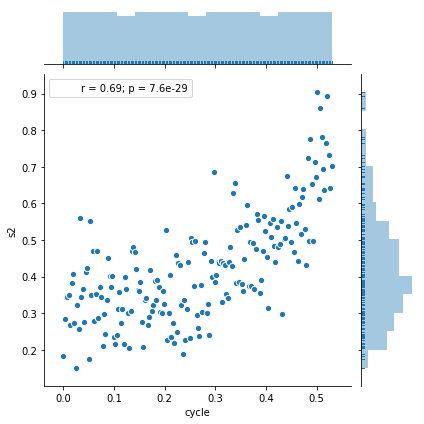

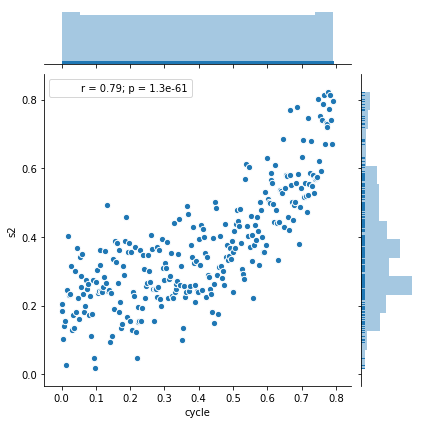

In [15]:
sns.jointplot("cycle", "s2", data=Xg[Xg.id == 1],
                  marginal_kws=dict(bins=15, rug=True),
                  annot_kws=dict(stat="r"),
                  s=40, edgecolor="w", linewidth=1)

sns.jointplot("cycle", "s2", data=Xg[Xg.id == 2],
                  marginal_kws=dict(bins=15, rug=True),
                  annot_kws=dict(stat="r"),
                  s=40, edgecolor="w", linewidth=1)

Text(3.8,4.5,'setosa')

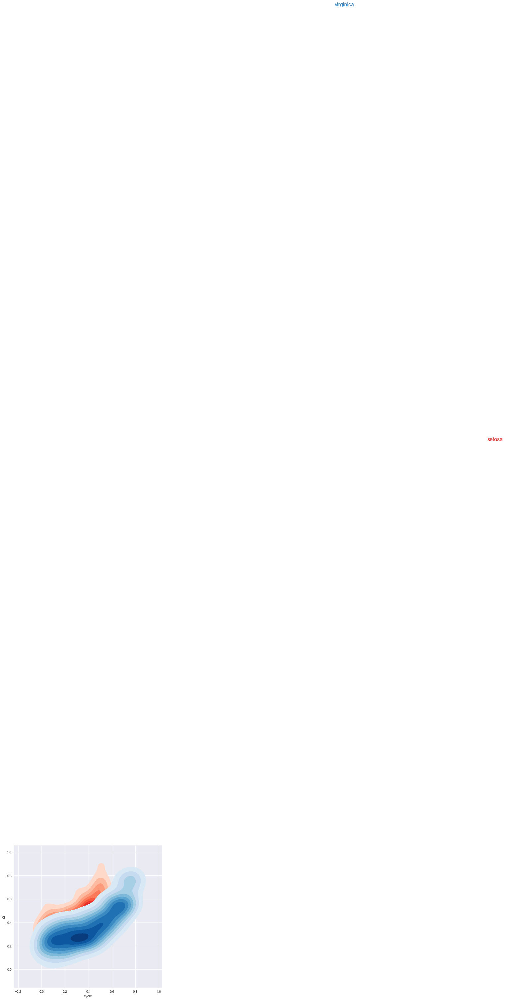

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="darkgrid")
iris = sns.load_dataset("iris")

# Subset the iris dataset by species
setosa = iris.query("species == 'setosa'")
virginica = iris.query("species == 'virginica'")

# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
ax.set_aspect("equal")

# Draw the two density plots
ax = sns.kdeplot(Xg[Xg.id == 1].cycle,Xg[Xg.id == 1].s2,
                 cmap="Reds", shade=True, shade_lowest=False)
ax = sns.kdeplot(Xg[Xg.id == 2].cycle,Xg[Xg.id == 2].s2,
                 cmap="Blues", shade=True, shade_lowest=False)

# Add labels to the plot
red = sns.color_palette("Reds")[-2]
blue = sns.color_palette("Blues")[-2]
ax.text(2.5, 8.2, "virginica", size=16, color=blue)
ax.text(3.8, 4.5, "setosa", size=16, color=red)

In [17]:
np.linspace(0, 3, 10)


array([0.        , 0.33333333, 0.66666667, 1.        , 1.33333333,
       1.66666667, 2.        , 2.33333333, 2.66666667, 3.        ])

/Users/Amer/anaconda2/envs/py3/lib/python3.6/site-packages/statsmodels/nonparametric/kernels.py:128: RuntimeWarning:

invalid value encountered in true_divide

/Users/Amer/anaconda2/envs/py3/lib/python3.6/site-packages/matplotlib/contour.py:1534: UserWarning:


/Users/Amer/anaconda2/envs/py3/lib/python3.6/site-packages/matplotlib/contour.py:1535: UserWarning:




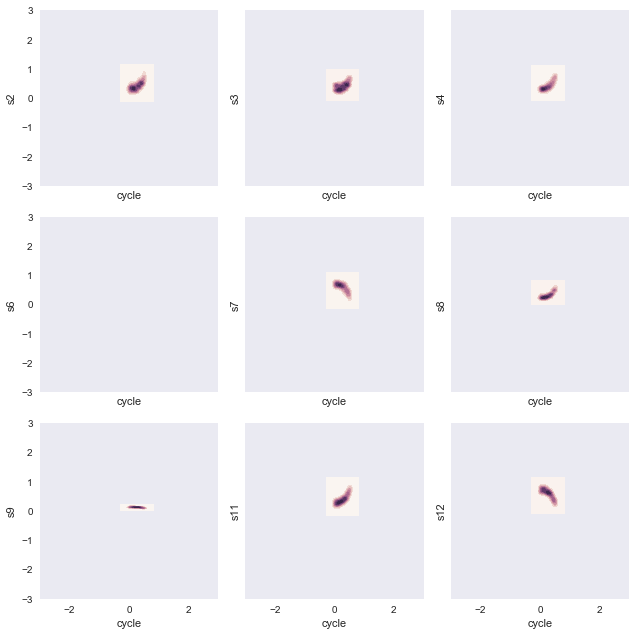

In [18]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="dark")

# Set up the matplotlib figure
f, axes = plt.subplots(3, 3, figsize=(9, 9), sharex=True, sharey=True)

# Create a cubehelix colormap to use with kdeplot
cmap = sns.cubehelix_palette(start=0, light=1, as_cmap=True)

# Rotate the starting point around the cubehelix hue circle
for ax,sensor in zip(axes.flat,['s2', 's3', 's4', 's6', 's7', 's8','s9', 's11', 's12']):
    # Generate and plot a random bivariate dataset
    sns.kdeplot(Xg[Xg.id == 1].cycle, Xg[Xg.id == 1][sensor], cmap=cmap, shade=True, cut=5, ax=ax)
    ax.set(xlim=(-3, 3), ylim=(-3, 3))

f.tight_layout()

In [19]:
sns.kdeplot(Xg[Xg.id == 1].cycle, Xg[Xg.id == 1]['s2'], cmap=cmap, shade=True, cut=5, ax=ax)
    ax.set(xlim=(-3, 3), ylim=(-3, 3))

IndentationError: unexpected indent (<ipython-input-19-951876e80f54>, line 2)

In [ ]:
sns.jointplot(Xg[Xg.id == 1].cycle, Xg[Xg.id == 1]['s2'], kind="kde", size=7, space=0)
sns.jointplot(Xg[Xg.id == 1].cycle, Xg[Xg.id == 1]['s3'], kind="kde", size=7, space=0)
sns.jointplot(Xg[Xg.id == 1].cycle, Xg[Xg.id == 1]['s4'], kind="kde", size=7, space=0)

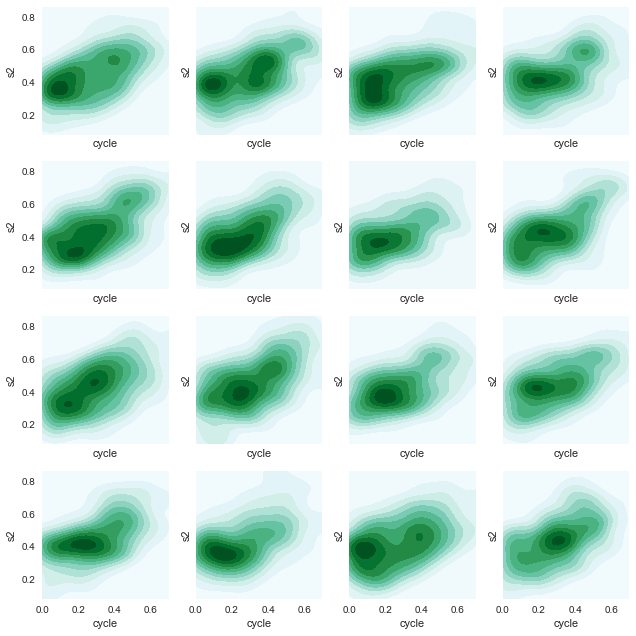

In [161]:
f, axes = plt.subplots(4, 4, figsize=(9, 9), sharex=True, sharey=True)
for ax,e in zip(axes.flat,range(1,17)):
  x = Xg[Xg.id == e].cycle
  y = Xg[Xg.id == e]["s2"]
  sns.kdeplot(x, y, shade=True, cut=5, ax=ax)
  ax.set(xlim=(x.min(), x.max()), ylim=(y.min(), y.max()))
f.tight_layout()

ValueError: Could not interpret input 'total_bill'

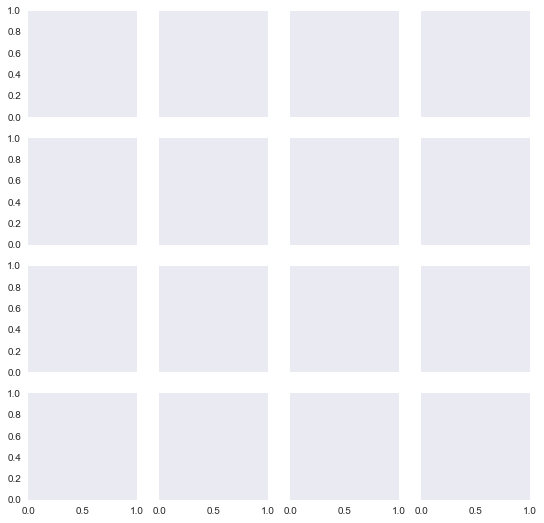

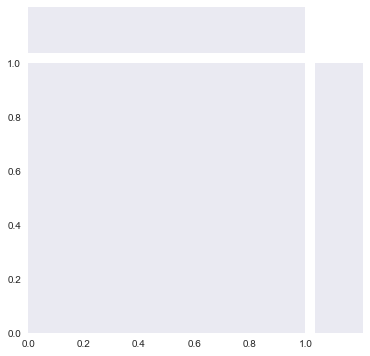

In [181]:
f, axes = plt.subplots(4, 4, figsize=(9, 9), sharex=True, sharey=True)
for ax,e in zip(axes.flat,range(1,17)):
  x = Xg[Xg.id == e].cycle
  y = Xg[Xg.id == e]["s4"]
  df = pd.DataFrame(x,y)
  #sns.kdeplot(x, y, shade=True, cut=5, ax=ax)
  #sns.jointplot("total_bill", "tip", data=df, kind="reg", color="r")
  #sns.kdeplot(x, y, ax=ax,clip_on=False, shade=True, alpha=1, lw=1.5, bw=.2)
  #ax.set(xlim=(x.min(), x.max()), ylim=(y.min(), y.max()))
f.tight_layout()

In [207]:
e.columns

Index(['id', 'cycle', 'setting1', 'setting2', 's2', 's3', 's4', 's6', 's7',
       's8', 's9', 's11', 's12', 's13', 's14', 's15', 's17', 's20', 's21',
       'a2', 'a3', 'a4', 'a6', 'a7', 'a8', 'a9', 'a11', 'a12', 'a13', 'a14',
       'a15', 'a17', 'a20', 'a21', 'sd2', 'sd3', 'sd4', 'sd6', 'sd7', 'sd8',
       'sd9', 'sd11', 'sd12', 'sd13', 'sd14', 'sd15', 'sd17', 'sd20', 'sd21'],
      dtype='object')

Text(0,0.5,'Sensors')

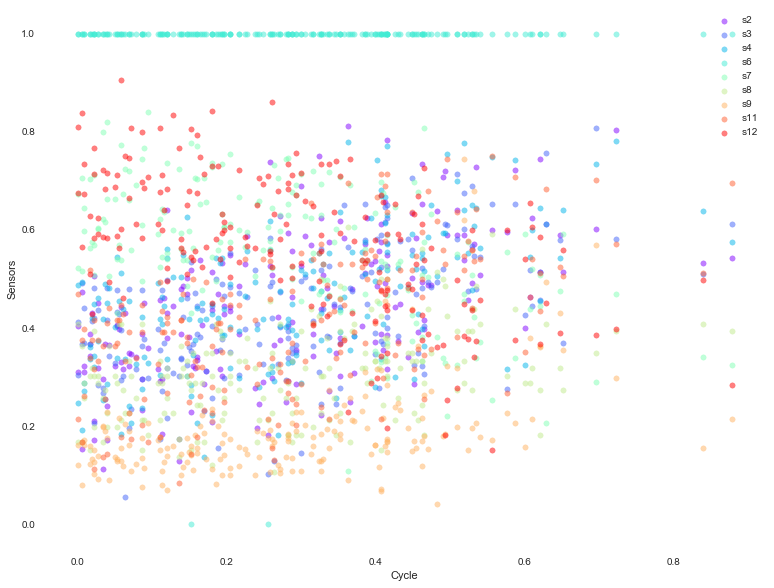

In [214]:
e = Xg[Xg.id == 1]
sensors = ['s2', 's3', 's4', 's6' ,'s7','s8', 's9', 's11', 's12']#, 's13', 's14', 's15', 's17', 's20', 's21']

color=iter(cm.rainbow(np.linspace(0,1,len(sensors))))

plt.figure(figsize=(13,10))
plt.rcParams['axes.facecolor'] = 'white'

for s in sensors:
  plt.scatter(x=e.cycle,y=e[s], c=next(color), s=30,alpha=0.5)
plt.legend()

plt.xlabel("Cycle")
plt.ylabel("Sensors")

Text(0,0.5,'Sensors')

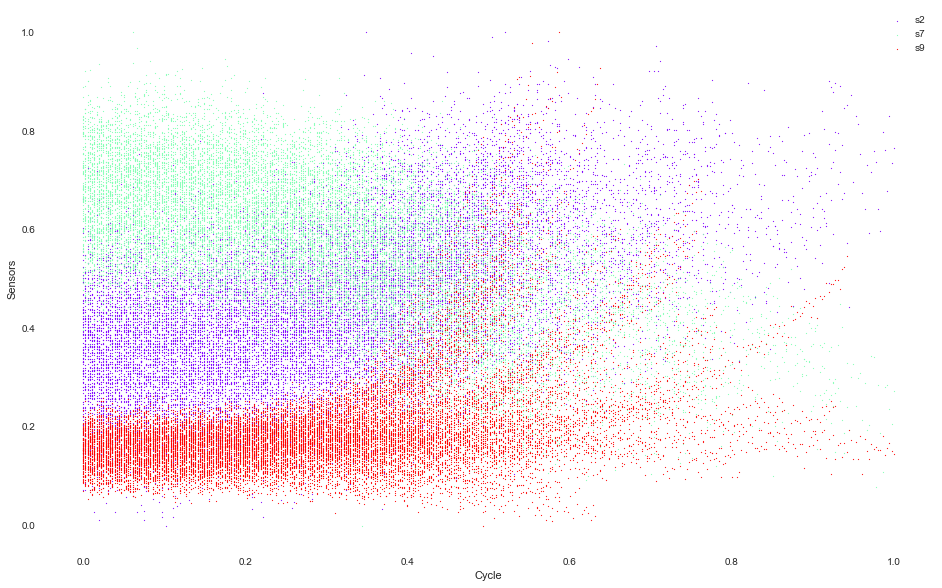

In [329]:
e = Xg#[Xg.id == 1]
sensors = ['s2', 's7','s9']#, 's6' ,'s7','s8', 's9', 's11', 's12']#, 's13', 's14', 's15', 's17', 's20', 's21']



color=iter(cm.rainbow(np.linspace(0,1,len(sensors))))

plt.figure(figsize=(16,10))
plt.rcParams['axes.facecolor'] = 'white'

for s in sensors:
  plt.scatter(x=e.cycle,y=e[s], c=next(color), s=.8,alpha=1)
  
plt.legend()
plt.xlabel("Cycle")
plt.ylabel("Sensors")

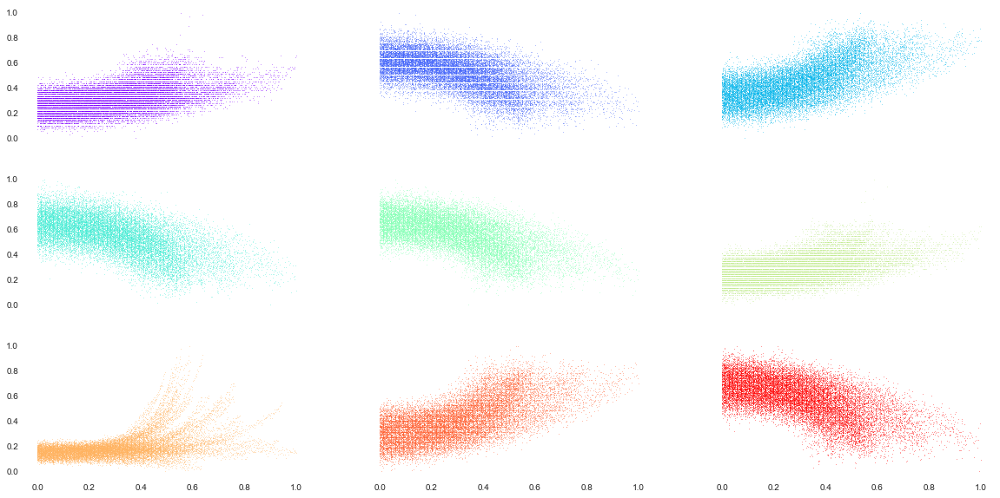

In [953]:
e = Xg#[Xg.id == 1]
#e = e[e.cycle == e['cycle'].max()]
f, axes = plt.subplots(ncols=3, nrows=3, figsize=(20, 10), sharex=True, sharey=True)
sensors = ['s13', 's20', 's4', 's21', 's7','s8', 's9', 's11', 's12']#, 's13', 's14', 's15', 's17', 's20', 's21']
color=iter(cm.rainbow(np.linspace(0,1,len(sensors))))

for s,ax in zip(sensors,axes.flat):
  ax.scatter(x=e.cycle,y=e[s], c=next(color), s=.5,alpha=0.4)
  #ax.legend(loc='upper right')

plt.show()

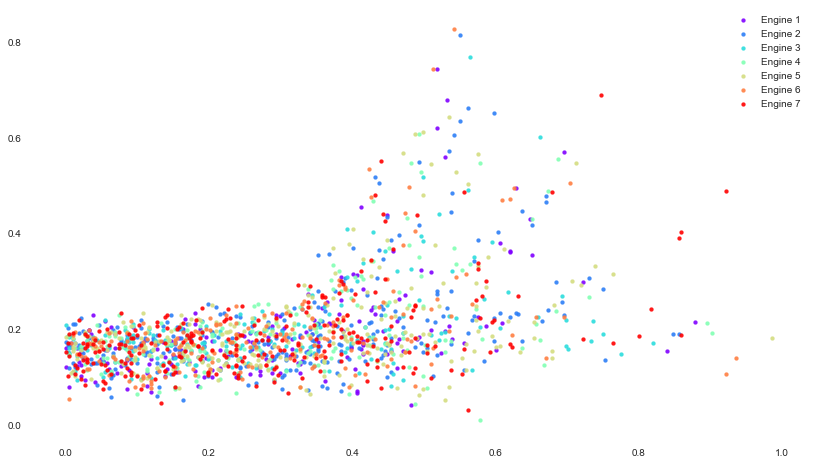

In [422]:
def get_eng(eng_id):
  return Xg[Xg.id == eng_id]


f, axes = plt.subplots(ncols=1, nrows=1, figsize=(14, 8), sharex=True, sharey=True)

ids = range(1,8)
color=iter(cm.rainbow(np.linspace(0,1,len(ids))))
for i in ids:
  e = get_eng(i)
  plt.scatter(x=e.cycle,y=e.s9, c=next(color), s=15,alpha=0.9,label="Engine {}".format(i))

plt.title("Training set Engines")
plt.legend()
plt.show()

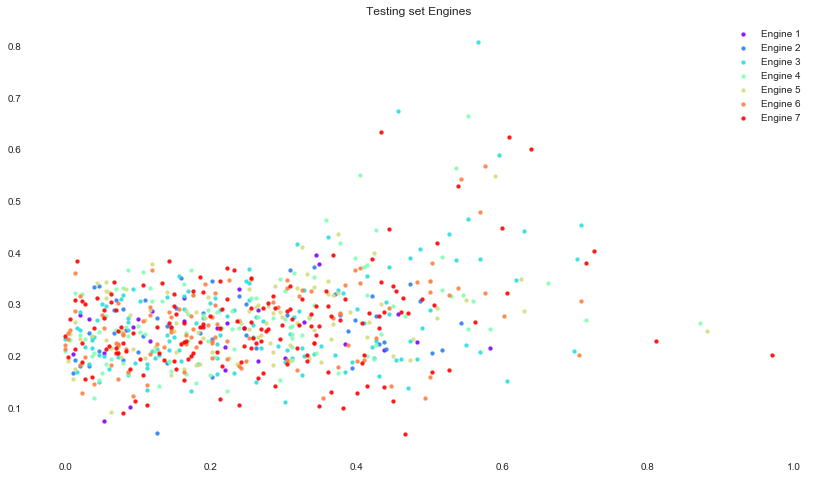

In [434]:
f, axes = plt.subplots(ncols=1, nrows=1, figsize=(14, 8), sharex=True, sharey=True)

ids = range(1,8)
color=iter(cm.rainbow(np.linspace(0,1,len(ids))))

for i in ids:
  e = Xgg[Xgg.id == i]
  plt.scatter(x=e.cycle,y=e.s9, c=next(color), s=15,alpha=0.9,label="Engine {}".format(i))
  
plt.title("Testing set Engines")
plt.legend()
plt.show()

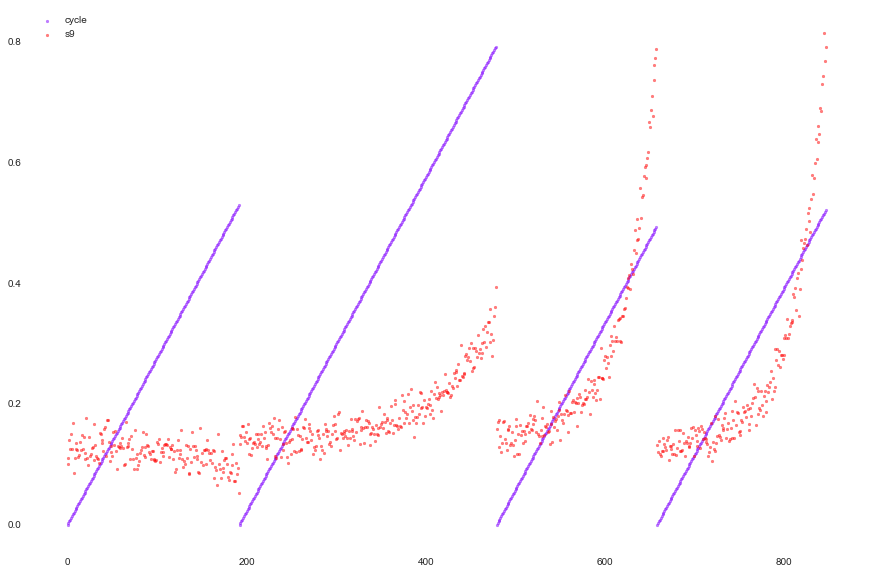

In [468]:
df = Xg
e = df[df.id.isin([1,2,3,4])]

plt.figure(figsize=(15,10))

cols = ['cycle','s9']
color=iter(cm.rainbow(np.linspace(0,1,len(cols))))

for col in cols:
  plt.scatter(np.arange(0, len(e), 1),e[col], c=next(color), s=8,alpha=0.5)


plt.grid()
plt.legend()
plt.show()

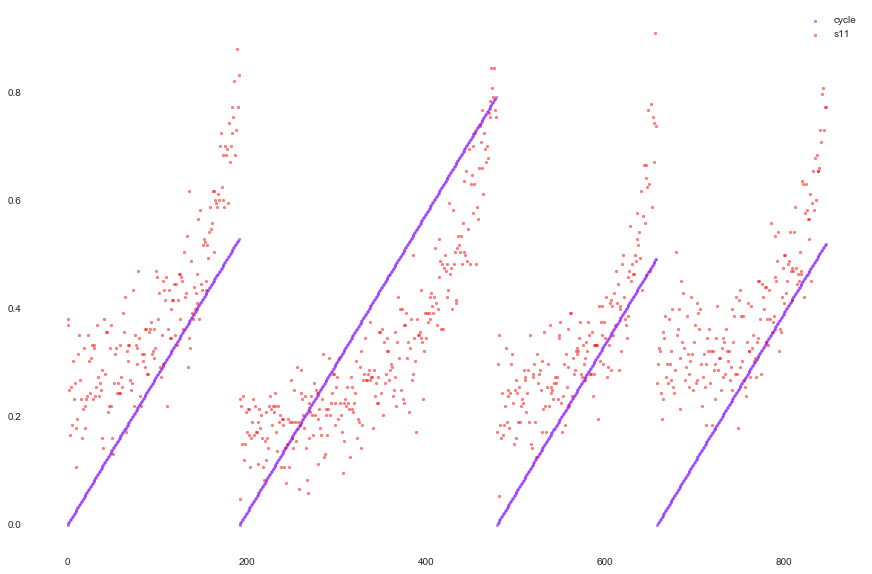

In [466]:
df = Xg
e = df[df.id.isin([1,2,3,4])]

plt.figure(figsize=(15,10))

cols = ['cycle','s11']
color=iter(cm.rainbow(np.linspace(0,1,len(cols))))
for col in cols:
  plt.scatter(np.arange(0, len(e), 1),e[col], c=next(color), s=8,alpha=0.5)


plt.grid()
plt.legend()
plt.show()

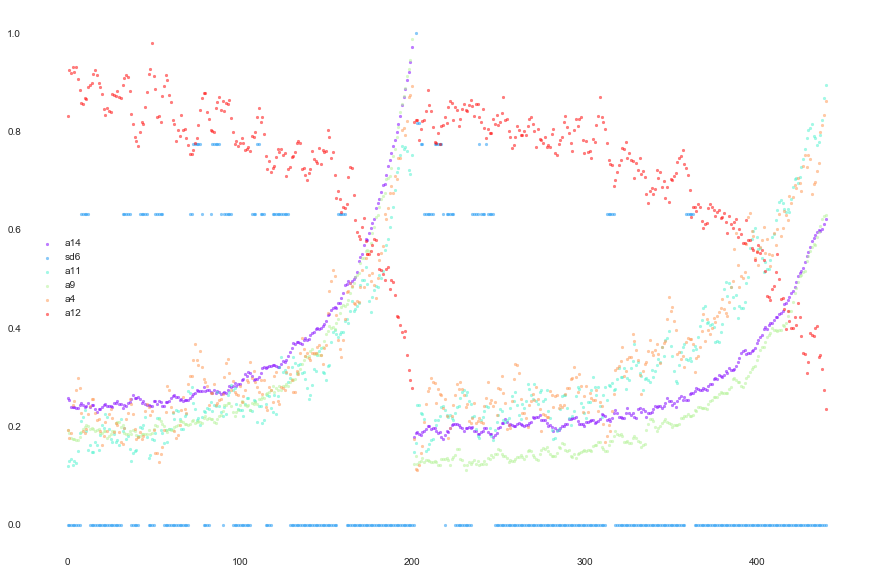

In [702]:
df = Xg
e = df[df.id.isin([9,11])]

plt.figure(figsize=(15,10))

# cols = ['sd3','sd11','sd4','sd8','sd9']
cols = ['a14','sd6','a11','a9','a4','a12']
color=iter(cm.rainbow(np.linspace(0,1,len(cols))))
for col in cols:
  plt.scatter(np.arange(0, len(e), 1),e[col], c=next(color), s=8,alpha=0.5)


plt.grid()
plt.legend()
plt.show()

In [909]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor

params = {'loss':'huber',
          'learning_rate':0.15,
          'max_leaf_nodes':16,
          'n_estimators':11,}


params = {
  'loss':'huber',
  'learning_rate':0.7,
  'max_leaf_nodes':16,
  'n_estimators':11,
  }


# params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,'learning_rate': 0.01, 'loss': 'ls'}
clf = GradientBoostingRegressor(**params)

X_train, y_train = X, y
X_test, y_test = Xtest, ytest


clf.fit(X_train, y_train)

mae = mean_absolute_error(y_test,clf.predict(X_test))
print("MAE: %.4f" % mae)

MAE: 23.8826


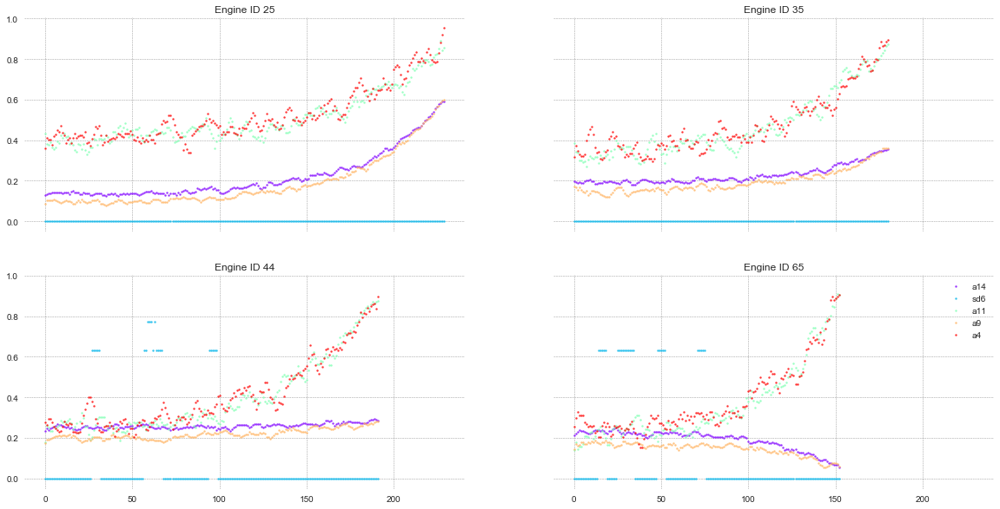

In [910]:
f, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 10), sharex=True, sharey=True)

df = Xg

ids = [25,35,44,65]

for eng,ax in zip(ids,axes.flat):
  cols = ['a14','sd6','a11','a9','a4']
  e = df[df.id == eng]
  color=iter(cm.rainbow(np.linspace(0,1,len(cols))))
  for col in cols:
    ax.scatter(np.arange(0, len(e), 1),e[col], c=next(color), s=4,alpha=0.8)
    ax.set_title("Engine ID {}".format(eng))
    ax.grid(color='k', linestyle='--', linewidth=0.5,alpha=.4)
    
plt.legend()
plt.show()

In [911]:
params = {
  'loss':'huber',
  'learning_rate':0.15,
  'max_leaf_nodes':16,
  'n_estimators':11,
}


# params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,'learning_rate': 0.01, 'loss': 'ls'}
clf2 = GradientBoostingRegressor(**params)

X_train, y_train = X, y
X_test, y_test = Xtest, ytest


clf2.fit(X_train, y_train)

mae = mean_absolute_error(y_test,clf2.predict(X_test))
print("MAE: %.4f" % mae)

MAE: 17.3576


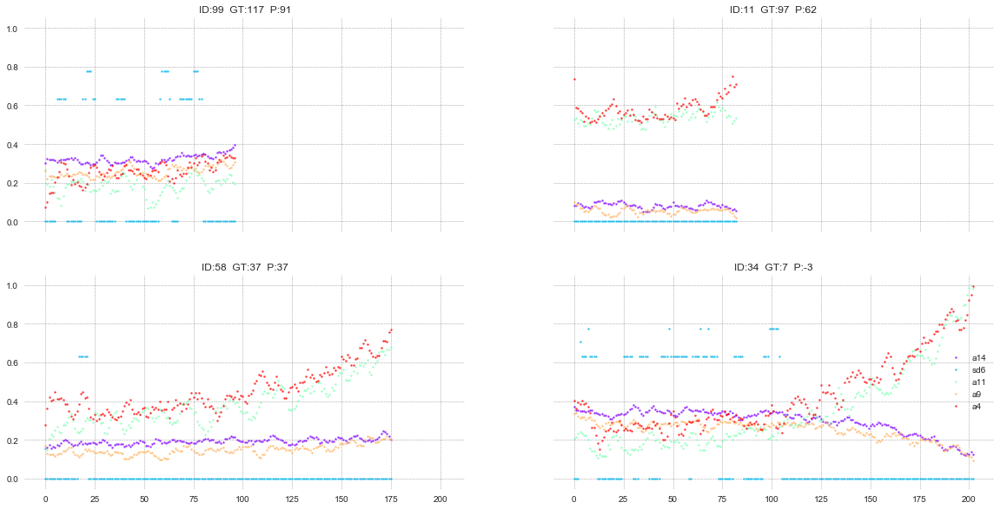

In [912]:
f, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 10), sharex=True, sharey=True)

df = Xgg

results_df = pd.DataFrame({
  "id": range(1,101),
  "predicted_RUL":clf.predict(Xtest),
  "gt_RUL":ytest
})

ids = [99,11,58,34]

for eng_id,ax in zip(ids,axes.flat):
  cols = ['a14','sd6','a11','a9','a4']
  e = df[df.id == eng_id]
  color=iter(cm.rainbow(np.linspace(0,1,len(cols))))
  for col in cols:
    r = results_df[results_df.id==eng_id]
    ax.scatter(np.arange(0, len(e), 1),e[col], c=next(color), s=4,alpha=0.8)
    ax.set_title("ID:{}  GT:{}  P:{}".format(eng_id,int(r.gt_RUL),int(r.predicted_RUL)))
    ax.grid(color='k', linestyle='--', linewidth=0.5,alpha=.4)

plt.legend()
plt.show()

In [937]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor

params = {
  'loss':'huber',
  'learning_rate':0.4,
  'max_leaf_nodes':10,
  'n_estimators':60,
}


# params = {
#   'loss':'huber',
#   'learning_rate':0.01,
#   'max_leaf_nodes':50,
#   'n_estimators':700,
# }


# params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,'learning_rate': 0.01, 'loss': 'ls'}
clf = GradientBoostingRegressor(**params)

X_train, y_train = X, y
X_test, y_test = Xtest, ytest


clf.fit(X_train, y_train)

mae = mean_absolute_error(y_test,clf.predict(X_test))
print("MAE: %.4f" % mae)

MAE: 26.3422


Min error = 292.2058444554421 at iteration 3


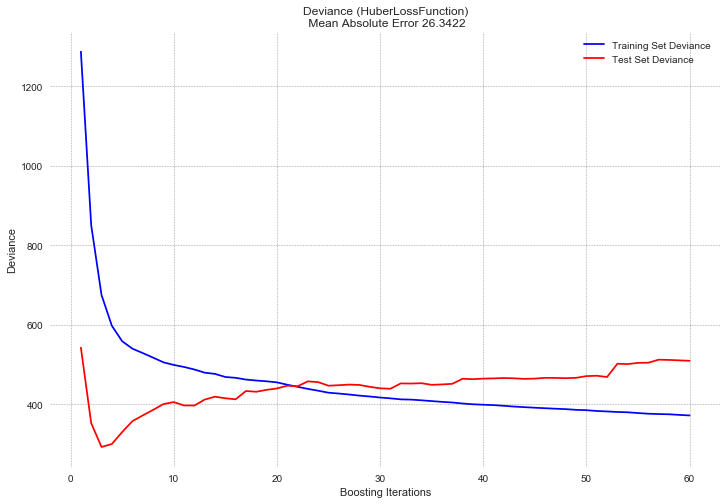

In [938]:
# compute test set deviance
test_score = np.zeros((params['n_estimators'],), dtype=np.float64)


for i, y_pred in enumerate(clf.staged_predict(X_test)):
    test_score[i] = clf.loss_(y_test, y_pred,)


index_min = min(range(len(test_score)), key=test_score.__getitem__)
print("Min error = %s at iteration %s" % (test_score[index_min],index_min+1)) 

plt.figure(figsize=(12, 8))
#plt.subplot(1, 2, 1)
plt.title("Deviance (HuberLossFunction)\n Mean Absolute Error %.4f" % mae)
plt.plot(np.arange(params['n_estimators']) + 1, clf.train_score_, 'b-',label='Training Set Deviance')
plt.plot(np.arange(params['n_estimators']) + 1, test_score, 'r-',label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance')
plt.grid(color='k', linestyle='--', linewidth=0.5,alpha=.4)
plt.show()

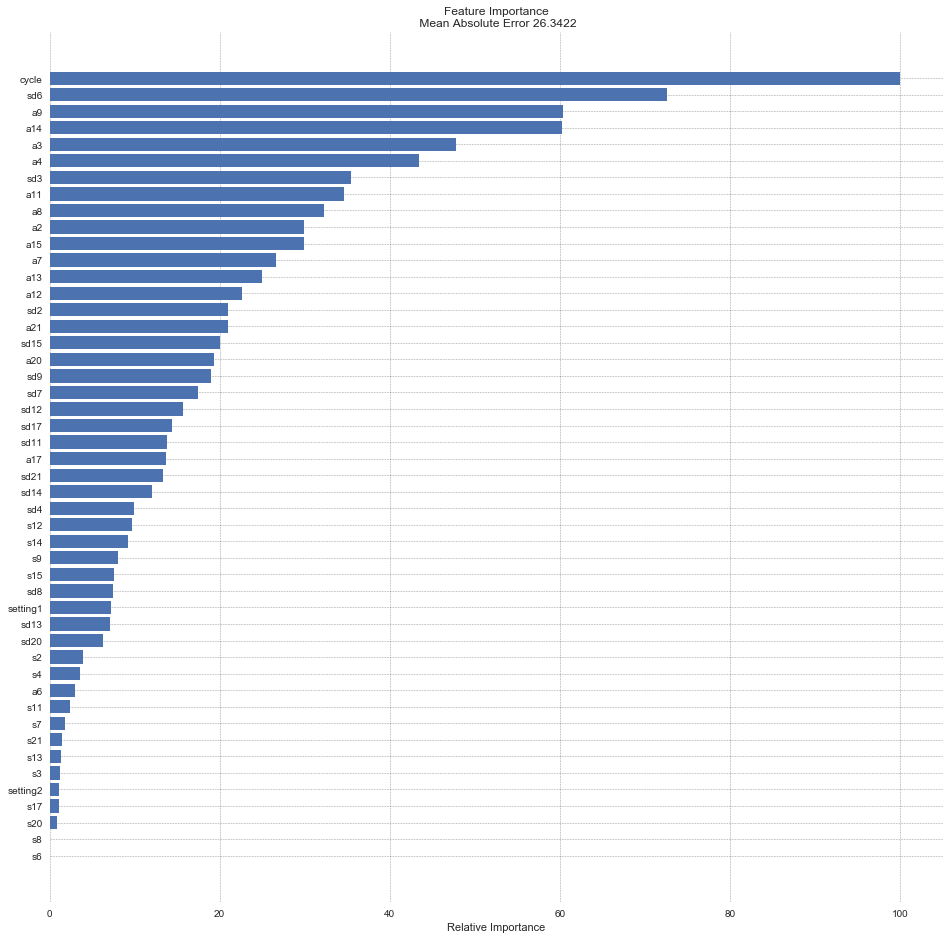

In [939]:
# #############################################################################
# Plot feature importance
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
#plt.subplot(1, 2, 2)
plt.figure(figsize=(16, 16))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title("Feature Importance\n Mean Absolute Error %.4f" % mae)
plt.grid(color='k', linestyle='--', linewidth=0.5,alpha=.4)
plt.show()

Min error = 19.734501323422233 at iteration 4


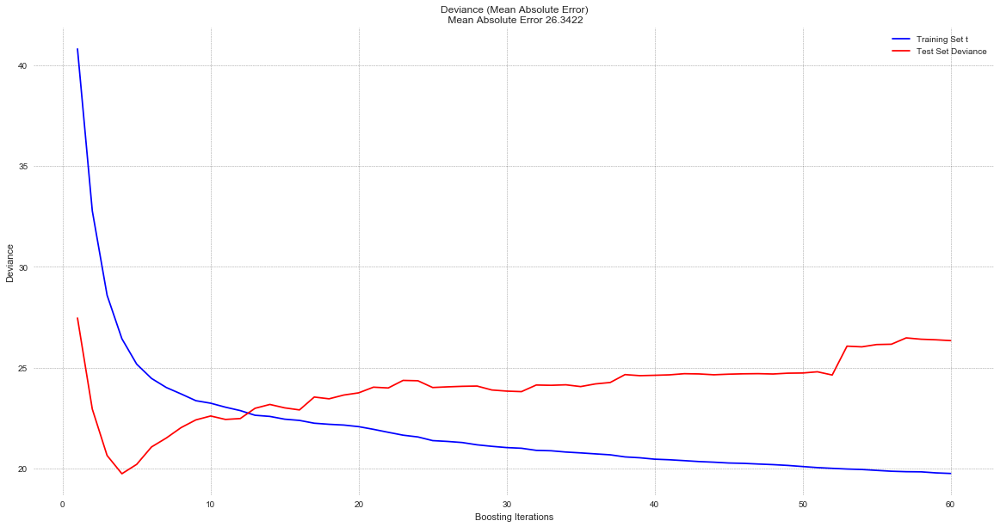

In [940]:
# compute test set deviance
test_score_mae = np.zeros((params['n_estimators'],), dtype=np.float64)
train_score_mae = np.zeros((params['n_estimators'],), dtype=np.float64)

for i, y_pred in enumerate(clf.staged_predict(X_test)):
  test_score_mae[i] = mean_absolute_error(y_test,y_pred)
  
for i, y_pred in enumerate(clf.staged_predict(X_train)):
  train_score_mae[i] = mean_absolute_error(y_train,y_pred)
  
mae = mean_absolute_error(y_test,clf.predict(X_test))

index_min = min(range(len(test_score_mae)), key=test_score_mae.__getitem__)
print("Min error = %s at iteration %s" % (test_score_mae[index_min],index_min+1)) 

plt.figure(figsize=(20, 10))
plt.title("Deviance (Mean Absolute Error)\n Mean Absolute Error %.4f" % mae)
plt.plot(np.arange(params['n_estimators']) + 1, train_score_mae, 'b-',label='Training Set t')
plt.plot(np.arange(params['n_estimators']) + 1, test_score_mae, 'r-',label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance')
plt.grid(color='k', linestyle='--', linewidth=0.5,alpha=.4)
plt.show()

In [1]:
params

NameError: name 'params' is not defined